In [1]:
import pandas as pd
import networkx as nx
import numpy as np
from contextily import add_basemap
import geopandas as gpd
import matplotlib.pyplot as plt
import plotly.express as px

## functions

In [94]:
def nodes_color(graph):
    centrality=nx.eigenvector_centrality(graph, weight='weight')
    red_nodes=[i[0] for i in centrality.items() if i[1] >= 0.3]
    orange_nodes=[i[0] for i in centrality.items() if i[1] < 0.3 and i[1] >= 0.2 ]
    yellow_nodes=[i[0] for i in centrality.items() if i[1] < 0.2 and i[1] >= 0.1 ]
    color_map=[]
    for node in graph.nodes():
        if node in red_nodes:
            color_map.append('red')
        elif node in orange_nodes:
            color_map.append('orange')
        elif node in yellow_nodes:
            color_map.append('yellow')
        else:
            color_map.append('blue')
    return color_map

# evolution by trimester

In [3]:
trimester=pd.read_excel('Donnees_trimestrielles_SLO_interurbains_autocar.xlsx', 'Tab3-Données liaisons', skiprows = 2)

In [4]:
trimester

,Année,Trimestre,Liaison,Unité urbaine A,Unité urbaine B,Nombre d'opérateurs,Nombre de trajets sur le trimestre,Opérateur,Nombre de trajets desservis par l'opérateur
0,2015,3,00553_00753,00553,00753,1,216,Eurolines,216
1,2015,3,00553_00760,00553,00760,1,216,Eurolines,216
2,2015,3,00553_11501,00553,11501,1,216,Eurolines,216
3,2015,3,00553_34502,00553,34502,1,216,Eurolines,216
4,2015,3,00553_34701,00553,34701,1,216,Eurolines,216
...,...,...,...,...,...,...,...,...,...
34732,2022,2,83302_83307,83302,83307,1,3,BlaBlaCar,3
34733,2022,2,83307_83311,83307,83311,1,6,BlaBlaCar,6
34734,2022,2,86601_91401,86601,91401,1,91,FlixBus,91
34735,2022,2,9D601_9D603,9D601,9D603,1,184,EscapadKreol,184


#### exclusion of regional companies

In [5]:
flix_ouibus=['FlixBus','BlaBlaCar','Ouibus']
blabla_bus=['BlaBlaCar','Ouibus']

In [6]:
trimester['Opérateur']=np.where(trimester['Opérateur'].isin(flix_ouibus), trimester['Opérateur'], 'autres')

In [7]:
trimester['Opérateur']=np.where(trimester['Opérateur'].isin(blabla_bus), 'BlaBlaCar (SNCF before 2019)', trimester['Opérateur'])

In [8]:
trimester

,Année,Trimestre,Liaison,Unité urbaine A,Unité urbaine B,Nombre d'opérateurs,Nombre de trajets sur le trimestre,Opérateur,Nombre de trajets desservis par l'opérateur
0,2015,3,00553_00753,00553,00753,1,216,autres,216
1,2015,3,00553_00760,00553,00760,1,216,autres,216
2,2015,3,00553_11501,00553,11501,1,216,autres,216
3,2015,3,00553_34502,00553,34502,1,216,autres,216
4,2015,3,00553_34701,00553,34701,1,216,autres,216
...,...,...,...,...,...,...,...,...,...
34732,2022,2,83302_83307,83302,83307,1,3,BlaBlaCar (SNCF before 2019),3
34733,2022,2,83307_83311,83307,83311,1,6,BlaBlaCar (SNCF before 2019),6
34734,2022,2,86601_91401,86601,91401,1,91,FlixBus,91
34735,2022,2,9D601_9D603,9D601,9D603,1,184,autres,184


In [9]:
trimester_ope=trimester.groupby(['Année', 'Opérateur'], as_index=False).sum(["Nombre de trajets desservis par l'opérateur"])

In [10]:
trimester_ope

,Année,Opérateur,Trimestre,Nombre d'opérateurs,Nombre de trajets sur le trimestre,Nombre de trajets desservis par l'opérateur
0,2015,BlaBlaCar (SNCF before 2019),300,229,107705,22615
1,2015,FlixBus,911,424,145279,66738
2,2015,autres,3195,1420,462194,266941
3,2016,BlaBlaCar (SNCF before 2019),1847,1638,766012,228203
4,2016,FlixBus,4911,3137,1164078,630001
5,2016,autres,4512,3766,1512831,635491
6,2017,BlaBlaCar (SNCF before 2019),3612,2776,931501,420969
7,2017,FlixBus,7651,4624,1185082,641568
8,2017,autres,3732,3007,903222,363401
9,2018,BlaBlaCar (SNCF before 2019),4493,3475,1150674,484561


In [11]:
fig = px.bar(trimester_ope, x="Année", y="Nombre de trajets desservis par l'opérateur",
             color='Opérateur',
             height=400)

In [12]:
fig.show()

In [13]:
nbr_links=trimester[trimester['Trimestre']==2].copy()

In [14]:
nbr_links['Année'].value_counts()

2019    1779
2018    1673
2022    1363
2017    1290
2016    1084
2021    1007
2020     437
Name: Année, dtype: int64

In [15]:
nbr_links=nbr_links.groupby(['Année', "Nombre d'opérateurs"], as_index=False).sum(["Nombre de trajets desservis par l'opérateur"])

In [16]:
nbr_links

,Année,Nombre d'opérateurs,Trimestre,Nombre de trajets sur le trimestre,Nombre de trajets desservis par l'opérateur
0,2016,1,924,99072,99072
1,2016,2,520,126236,63114
2,2016,3,360,186957,62313
3,2016,4,304,319604,79901
4,2016,5,60,87020,17402
5,2017,1,1232,107474,107474
6,2017,2,692,147130,73565
7,2017,3,648,359985,119995
8,2017,4,8,8760,2190
9,2018,1,1690,136505,136505


In [17]:
fig = px.bar(nbr_links, x="Année", y="Nombre de trajets desservis par l'opérateur",
             color="Nombre d'opérateurs",
             height=400)

In [18]:
fig.show()

# 2022 : an oligopoly situation between flixbus and blablacar

In [19]:
##referentiel geo des unites urbaines

In [20]:
uu=gpd.read_file('uu2020_2022.shp')

In [21]:
##nombre de liaisons

In [22]:
links=pd.read_excel('Donnees_trimestrielles_SLO_interurbains_autocar.xlsx', 'Tab3-Données liaisons', skiprows = 2)

In [23]:
links=links[links['Année']==2022].copy()

In [24]:
## select only uu with car connections

In [25]:
uu_A=links['Unité urbaine A'].tolist()

In [26]:
uu_B=links['Unité urbaine B'].tolist()

In [27]:
uu=uu[uu['uu2020'].isin(uu_A)|uu['uu2020'].isin(uu_B)].copy()
links=links[links['Unité urbaine A'].isin(uu['uu2020'].tolist())&links['Unité urbaine B'].isin(uu['uu2020'].tolist())].copy()

In [28]:
uu

,uu2020,libuu2020,tuu2017,tduu2017,type,nb_com,geometry
5,00454,Honfleur,Unité urbaine de 20 000 à 49 999 habitants,Unité urbaine de 20 000 à 24 999 habitants,Agglomération inter-départementale,12,"POLYGON ((0.29815 49.31441, 0.30705 49.31880, ..."
13,10601,Troyes,Unité urbaine de 100 000 à 199 999 habitants,Unité urbaine de 100 000 à 149 999 habitants,Agglomération intra-départementale,18,"POLYGON ((4.09099 48.23526, 4.09774 48.24769, ..."
15,00653,Genève (SUI)-Annemasse (partie française),Unité urbaine de 100 000 à 199 999 habitants,Unité urbaine de 150 000 à 199 999 habitants,Agglomération internationale,35,"MULTIPOLYGON (((6.29009 46.11720, 6.30244 46.1..."
117,80601,Amiens,Unité urbaine de 100 000 à 199 999 habitants,Unité urbaine de 150 000 à 199 999 habitants,Agglomération intra-départementale,11,"POLYGON ((2.37067 49.86586, 2.39612 49.86001, ..."
119,38502,Voiron,Unité urbaine de 50 000 à 99 999 habitants,Unité urbaine de 50 000 à 69 999 habitants,Agglomération intra-départementale,15,"POLYGON ((5.50236 45.31991, 5.50300 45.32638, ..."
...,...,...,...,...,...,...,...
2367,30601,Nîmes,Unité urbaine de 100 000 à 199 999 habitants,Unité urbaine de 150 000 à 199 999 habitants,Agglomération intra-départementale,9,"POLYGON ((4.28789 43.73647, 4.28556 43.71603, ..."
2370,73205,Bourg-Saint-Maurice,Unité urbaine de 5 000 à 9 999 habitants,Unité urbaine de 7 000 à 9 999 habitants,Agglomération intra-départementale,2,"POLYGON ((6.84611 45.69057, 6.87204 45.68030, ..."
2398,73109,Moûtiers,Unité urbaine de 2 000 à 4 999 habitants,Unité urbaine de 4 000 à 4 999 habitants,Agglomération intra-départementale,2,"POLYGON ((6.49655 45.46706, 6.50392 45.47787, ..."
2408,17402,Rochefort,Unité urbaine de 20 000 à 49 999 habitants,Unité urbaine de 30 000 à 39 999 habitants,Agglomération intra-départementale,5,"POLYGON ((-0.98442 45.90221, -0.97827 45.91452..."


In [29]:
## centroid of uu

In [30]:
uu=uu.to_crs('EPSG:2154')

In [31]:
uu.geometry=uu.geometry.centroid

In [32]:
uu=uu.to_crs('EPSG:4326')

In [33]:
## exclusion connections outside of europe

In [34]:
links=links[links['Liaison'].str.contains('A|B|C|D|E|F|G')==False].copy()

In [35]:
links=links.groupby(['Année','Liaison', 'Unité urbaine A', 'Unité urbaine B','Opérateur'], as_index=False).sum()

In [36]:
##keep only regular lines
links=links[links["Nombre de trajets desservis par l'opérateur"]>100].copy()

In [37]:
links

,Année,Liaison,Unité urbaine A,Unité urbaine B,Opérateur,Trimestre,Nombre d'opérateurs,Nombre de trajets sur le trimestre,Nombre de trajets desservis par l'opérateur
0,2022,00360_00760,00360,00760,FlixBus,3,2,296,296
5,2022,00460_00851,00460,00851,FlixBus,3,2,375,375
6,2022,00460_10601,00460,10601,FlixBus,3,2,206,206
7,2022,00460_51701,00460,51701,FlixBus,3,2,376,376
8,2022,00460_54701,00460,54701,FlixBus,3,2,345,345
...,...,...,...,...,...,...,...,...,...
1284,2022,79501_86601,79501,86601,FlixBus,3,2,452,452
1285,2022,79501_91401,79501,91401,FlixBus,3,2,174,174
1286,2022,82501_87601,82501,87601,BlaBlaCar,3,4,857,262
1287,2022,82501_87601,82501,87601,FlixBus,3,4,857,595


In [38]:
##coordinates of centroid A
links['x_A']=links['Unité urbaine A'].map(uu.set_index('uu2020')['geometry'].x)
links['y_A']=links['Unité urbaine A'].map(uu.set_index('uu2020')['geometry'].y)

##coordinates of centroid B
links['x_B']=links['Unité urbaine B'].map(uu.set_index('uu2020')['geometry'].x)
links['y_B']=links['Unité urbaine B'].map(uu.set_index('uu2020')['geometry'].y)

In [39]:
uu[uu['uu2020']=='67701']

,uu2020,libuu2020,tuu2017,tduu2017,type,nb_com,geometry
1030,67701,Strasbourg (partie française),Unité urbaine de 200 000 à 1 999 999 habitants,Unité urbaine de 300 000 à 499 999 habitants,Agglomération internationale,23,POINT (7.73096 48.56974)


## Network BlaBlaCar

In [40]:
links_Bl=links[links['Opérateur']=='BlaBlaCar'].copy()

In [41]:
nodes_Bl=list(zip(links_Bl['Unité urbaine A'], links_Bl['x_A'], links_Bl['y_A']))

In [42]:
nodes_Bl=list(dict.fromkeys(nodes_Bl))

In [43]:
len(nodes_Bl)

57

In [44]:
nodes_Bl_bis=list(zip(links_Bl['Unité urbaine B'], links_Bl['x_B'], links_Bl['y_B']))

In [45]:
nodes_Bl_bis=list(set(nodes_Bl_bis) - set(nodes_Bl))

In [46]:
len(nodes_Bl_bis)

21

In [47]:
nodes_Bl=nodes_Bl+nodes_Bl_bis

In [48]:
int(nodes_Bl[0][0])

465

### creation of network

In [49]:
##nodes

In [50]:
G=nx.Graph()

In [51]:
for i in range(0, len(nodes_Bl)):
    ##print(nodes_Bl[i][0])
    G.add_node(node_for_adding=int(nodes_Bl[i][0]), pos=(nodes_Bl[i][1],nodes_Bl[i][2]))

In [52]:
pos=nx.get_node_attributes(G,'pos')

In [53]:
## edges

In [54]:
edges_Bl=list(zip(links_Bl['Unité urbaine A'], links_Bl['Unité urbaine B'], links_Bl["Nombre de trajets desservis par l'opérateur"]))

In [55]:
for i in range(0, len(edges_Bl)):
    ##print(nodes_Bl[i][0])
    G.add_edge(int(edges_Bl[i][0]), int(edges_Bl[i][1]), weight=edges_Bl[i][2])

In [56]:
#plt.figure(3,figsize=(14,14)) 
#nx.draw(G,pos)
#labels = nx.get_edge_attributes(G,'weight')
#nx.draw_networkx_edge_labels(G,pos,edge_labels=labels)
#plt.show()

In [57]:
##size of edges
edges = G.edges()
weights = [G[u][v]['weight']*0.0015 for u,v in edges]


In [58]:
##plt.figure(3,figsize=(14,14)) 
##nx.draw(G, pos, width=weights)

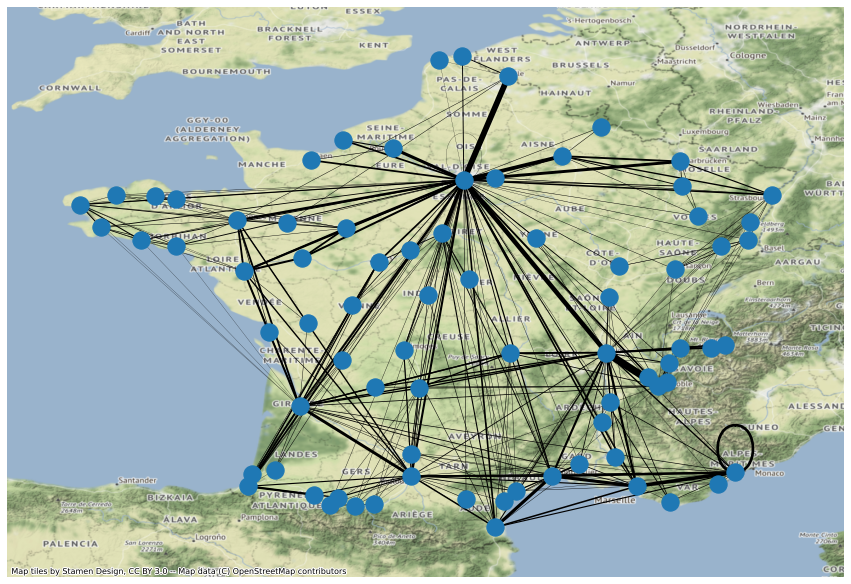

In [59]:
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
ax.axis("off")
nx.draw(G, pos, width=weights, ax=ax)
add_basemap(ax, crs="EPSG:4326")
plt.show()

### centrality 

In [60]:
eigenvector=nx.eigenvector_centrality(G, weight='weight')

In [62]:
red_nodes=[i[0] for i in eigenvector.items() if i[1] >= 0.3]
orange_nodes=[i[0] for i in eigenvector.items() if i[1] < 0.3 and i[1] >= 0.2 ]
yellow_nodes=[i[0] for i in eigenvector.items() if i[1] < 0.2 and i[1] >= 0.1 ]

In [63]:
print(red_nodes)
print(orange_nodes)
print(yellow_nodes)

[760, 851]
[758, 759, 33701, 34701, 38701]
[6701, 35701, 44701, 45701, 51701, 57701, 59702, 63701, 66701, 72701]


In [64]:
color_map=[]
for node in G.nodes():
    if node in red_nodes:
        color_map.append('red')
    elif node in orange_nodes:
        color_map.append('orange')
    elif node in yellow_nodes:
        color_map.append('yellow')
    else:
        color_map.append('blue')

In [65]:
##color_map

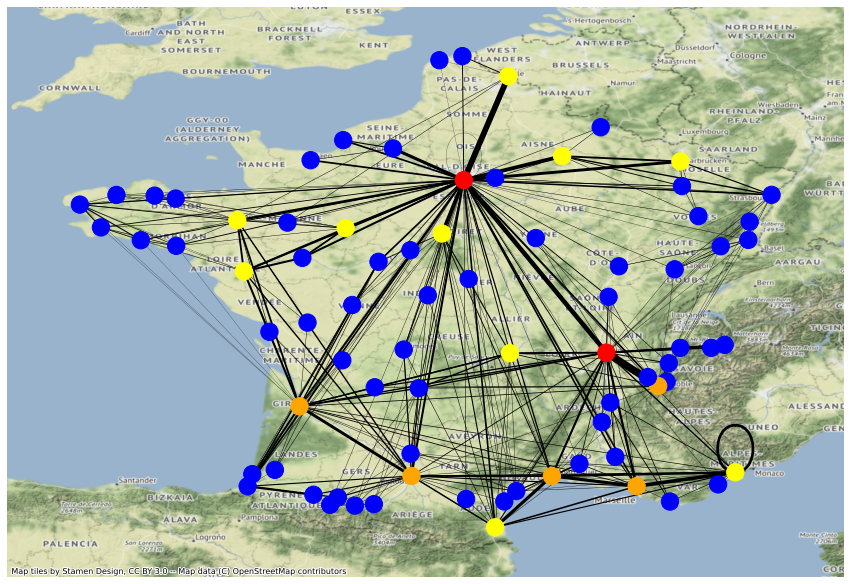

In [66]:
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
ax.axis("off")
nx.draw(G, pos, width=weights, ax=ax, node_color=color_map)
add_basemap(ax, crs="EPSG:4326")
plt.show()

## Network Flixbus

In [67]:
links_Fl=links[links['Opérateur']=='FlixBus'].copy()

In [68]:
links_Fl

,Année,Liaison,Unité urbaine A,Unité urbaine B,Opérateur,Trimestre,Nombre d'opérateurs,Nombre de trajets sur le trimestre,Nombre de trajets desservis par l'opérateur,x_A,y_A,x_B,y_B
0,2022,00360_00760,00360,00760,FlixBus,3,2,296,296,5.802617,46.118973,4.819440,45.787247
5,2022,00460_00851,00460,00851,FlixBus,3,2,375,375,4.969136,48.636745,2.305564,48.829930
6,2022,00460_10601,00460,10601,FlixBus,3,2,206,206,4.969136,48.636745,4.078013,48.303687
7,2022,00460_51701,00460,51701,FlixBus,3,2,376,376,4.969136,48.636745,4.039654,49.251604
8,2022,00460_54701,00460,54701,FlixBus,3,2,345,345,4.969136,48.636745,6.151435,48.723720
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1283,2022,79501_86401,79501,86401,FlixBus,3,2,246,246,-0.448914,46.317748,0.532537,46.814370
1284,2022,79501_86601,79501,86601,FlixBus,3,2,452,452,-0.448914,46.317748,0.339136,46.628340
1285,2022,79501_91401,79501,91401,FlixBus,3,2,174,174,-0.448914,46.317748,2.163453,48.432532
1287,2022,82501_87601,82501,87601,FlixBus,3,4,857,595,1.367295,44.007757,1.247217,45.842551


In [69]:
nodes_Fl=list(zip(links_Fl['Unité urbaine A'], links_Fl['x_A'], links_Fl['y_A']))

In [70]:
nodes_Fl=list(dict.fromkeys(nodes_Fl))

In [71]:
len(nodes_Fl)

92

In [72]:
nodes_Fl_bis=list(zip(links_Fl['Unité urbaine B'], links_Fl['x_B'], links_Fl['y_B']))

In [73]:
nodes_Fl_bis=list(set(nodes_Fl_bis) - set(nodes_Fl))

In [74]:
len(nodes_Fl_bis)

22

In [75]:
nodes_Fl=nodes_Fl+nodes_Fl_bis

In [76]:
len(nodes_Fl)

114

### creation of network

In [77]:
G2=nx.Graph()

In [78]:
for i in range(0, len(nodes_Fl)):
    ##print(nodes_Bl[i][0])
    G2.add_node(node_for_adding=int(nodes_Fl[i][0]), pos=(nodes_Fl[i][1],nodes_Fl[i][2]))

In [79]:
pos2=nx.get_node_attributes(G2,'pos')

In [80]:
edges_Fl=list(zip(links_Fl['Unité urbaine A'], links_Fl['Unité urbaine B'], links_Fl["Nombre de trajets desservis par l'opérateur"]))

In [81]:
for i in range(0, len(edges_Fl)):
    ##print(nodes_Bl[i][0])
    G2.add_edge(int(edges_Fl[i][0]), int(edges_Fl[i][1]), weight=edges_Fl[i][2])

In [82]:
##size of edges
edges = G2.edges()
weights2 = [G2[u][v]['weight']*0.0015 for u,v in edges]

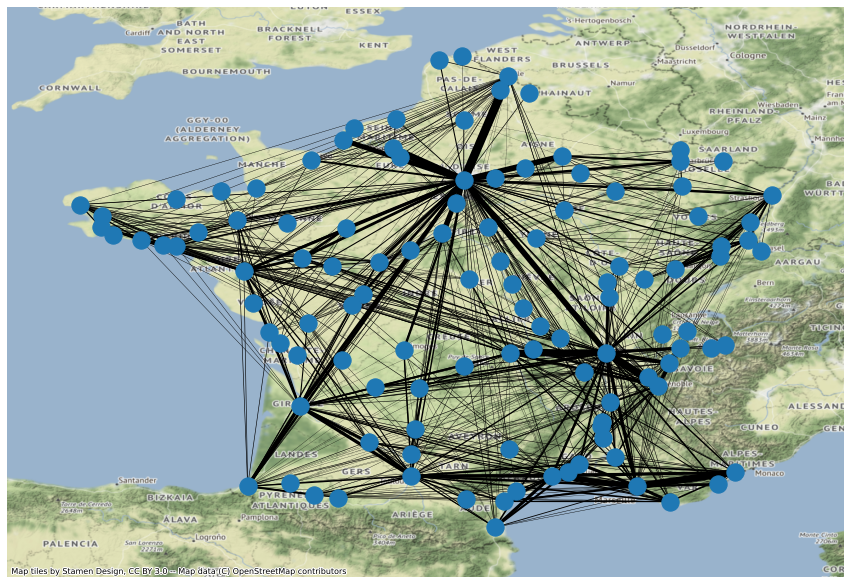

In [83]:
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
ax.axis("off")
nx.draw(G2, pos2, width=weights2, ax=ax)
add_basemap(ax, crs="EPSG:4326")
plt.show()

### centrality

In [84]:
eigenvector2=nx.eigenvector_centrality(G2, weight='weight')

In [85]:
eigenvector2

{360: 0.006090570573620125,
 460: 0.010815805825679953,
 465: 0.009978666476959665,
 551: 0.009987024359802886,
 553: 0.007960651233127648,
 557: 0.04728434004433593,
 558: 0.06526593838481873,
 651: 0.021224156768923197,
 652: 0.10754022342113563,
 653: 0.007561092382086619,
 751: 0.11477027922859867,
 753: 0.033580814374798096,
 754: 0.08100283949705554,
 755: 0.11589847683402875,
 756: 0.005440849945442198,
 757: 0.10518937661785636,
 758: 0.19947631824463227,
 759: 0.2537681771337294,
 760: 0.39733598170977735,
 851: 0.4150758829193831,
 2401: 0.006134512496129672,
 3105: 0.005558377409945623,
 3401: 0.005558555693931524,
 6701: 0.16146754182474155,
 10601: 0.018249810340374303,
 11401: 0.038399576488905046,
 11501: 0.0784215125058054,
 12401: 0.00876215584812609,
 14701: 0.039192799406825594,
 16601: 0.014029750761801364,
 17401: 0.010292207948316874,
 17402: 0.014228461441644762,
 17601: 0.04100165851286258,
 18501: 0.03870764755611042,
 19202: 0.025550937622231262,
 21401: 0.040

In [86]:
red_nodes=[i[0] for i in eigenvector2.items() if i[1] >= 0.3]
orange_nodes=[i[0] for i in eigenvector2.items() if i[1] < 0.3 and i[1] >= 0.2 ]
yellow_nodes=[i[0] for i in eigenvector2.items() if i[1] < 0.2 and i[1] >= 0.1 ]

In [87]:
print(red_nodes)
print(orange_nodes)
print(yellow_nodes)

[760, 851]
[759, 33701, 34701, 38701, 63701]
[652, 751, 755, 757, 758, 6701, 30601, 37701, 44701, 49701, 59702, 66701, 73601]


In [88]:

color_map=[]
for node in G2.nodes():
    if node in red_nodes:
        color_map.append('red')
    elif node in orange_nodes:
        color_map.append('orange')
    elif node in yellow_nodes:
        color_map.append('yellow')
    else:
        color_map.append('blue')

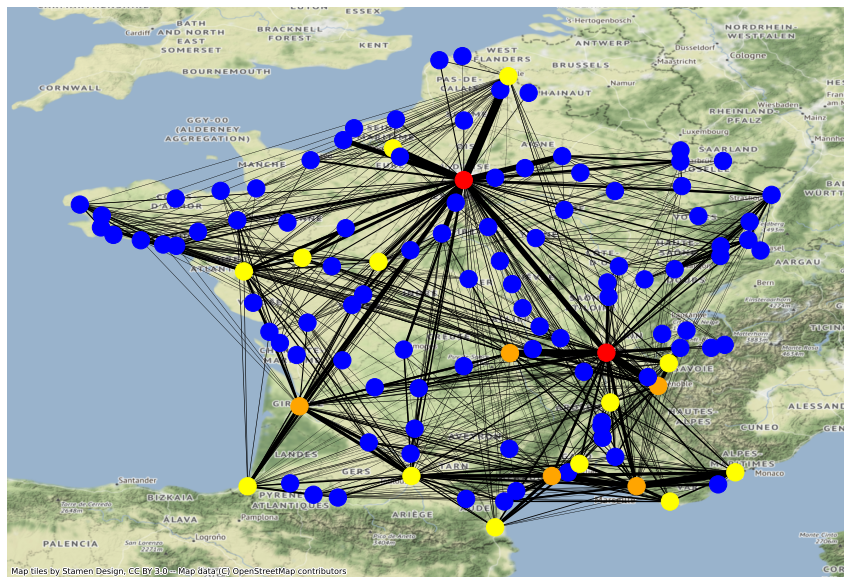

In [89]:
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
ax.axis("off")
nx.draw(G2, pos2, width=weights2, ax=ax, node_color=color_map)
add_basemap(ax, crs="EPSG:4326")
plt.show()

### comparison

In [95]:
len(nodes_color(G))

78

In [96]:
G.nodes()

NodeView((465, 553, 557, 558, 652, 751, 754, 755, 757, 758, 759, 760, 851, 6701, 8501, 11401, 11501, 16601, 17601, 18501, 21701, 22401, 22501, 24501, 25601, 29403, 29501, 29701, 30601, 31301, 33701, 34502, 34701, 35701, 36501, 37701, 38304, 38701, 41501, 44701, 45701, 49701, 51701, 53501, 54701, 56501, 57701, 59602, 59702, 63701, 64701, 65204, 65302, 66701, 67701, 74301, 82501, 71501, 40501, 56601, 40301, 62503, 14701, 74601, 76701, 65501, 72701, 86601, 73601, 88501, 79501, 77501, 83502, 68701, 89402, 87601, 38502, 68501))

In [97]:
G2.nodes()

NodeView((360, 460, 465, 551, 553, 557, 558, 651, 652, 653, 751, 753, 754, 755, 756, 757, 758, 759, 760, 851, 2401, 3105, 3401, 6701, 10601, 11401, 11501, 12401, 14701, 16601, 17401, 17402, 17601, 18501, 19202, 21401, 21701, 22501, 24501, 25601, 26110, 29205, 29404, 29501, 29701, 30601, 33701, 34502, 34701, 35402, 35701, 37701, 38701, 39402, 41501, 42502, 44701, 45501, 45701, 46401, 47501, 49202, 49701, 50302, 51501, 51701, 53501, 54701, 56301, 56402, 56501, 56601, 57501, 57701, 59602, 59702, 63701, 64301, 64701, 65501, 66701, 67701, 68403, 68501, 68701, 72701, 73601, 74301, 74601, 79501, 82501, 86601, 71501, 62503, 58202, 63303, 76701, 59701, 57601, 84302, 88501, 77501, 76401, 83502, 89402, 87601, 38502, 76403, 85501, 91401, 86401, 80601, 58501, 27402))

In [98]:
len(nodes_color(G2))

114

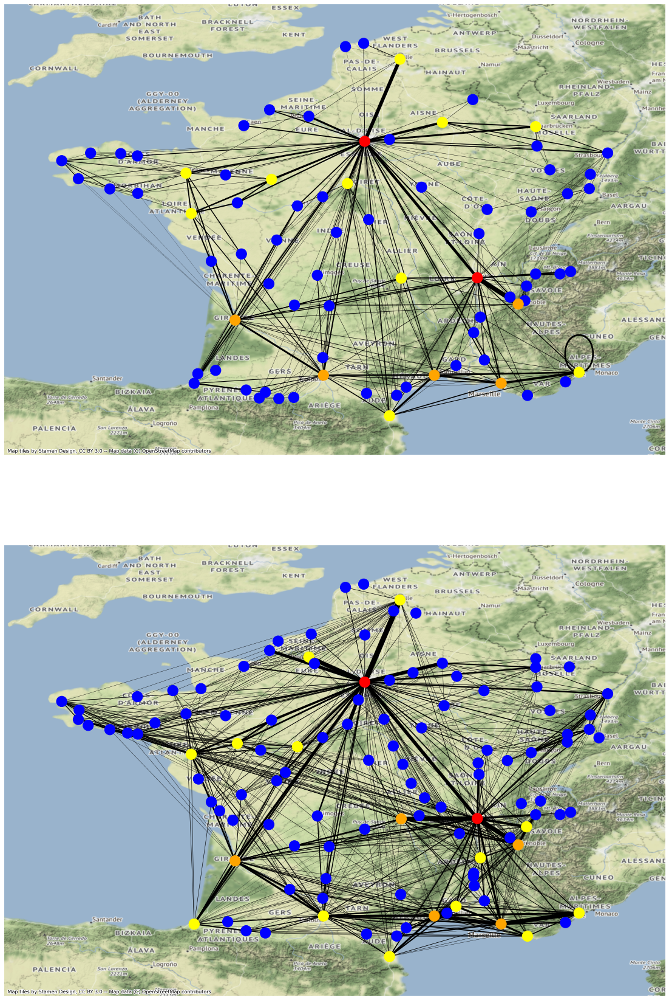

In [114]:
###definition du cadre
fig, (ax1,ax2) = plt.subplots(nrows=2, ncols=1, figsize=(30, 30))
##G1
color_map=nodes_color(G)
nx.draw(G, pos, width=weights, ax=ax1, node_color=color_map);
add_basemap(ax1, crs="EPSG:4326")
###G2
color_map=nodes_color(G2)
nx.draw(G2, pos2, width=weights2, ax=ax2, node_color=color_map);
add_basemap(ax2, crs="EPSG:4326")
plt.show()

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
ax.axis("off")
nx.draw(G2, pos, width=weights, ax=ax, node_color=color_map)
add_basemap(ax, crs="EPSG:4326")
plt.show()

In [ ]:
###definition du cadre
fig, (ax1,ax2) = plt.subplots(nrows=2, ncols=1, figsize=(15, 15))

##ax1.axis('off')
#ax2.axis('off')
### name of graphics
ax1.set_title('Number of buildings per municipality in the Loire-Atlantique', fontsize=24)
ax2.set_title("Number of constructions per inhabitant for each commune in the Loire-Atlantique", fontsize=24)

###graphic matrix knn
ax1=dep_44.plot(ax=ax1,column='Num_DAU',  cmap='autumn_r', legend=True, alpha=0.8,  legend_kwds={'shrink': 0.9});
cx.add_basemap(ax1, crs=dep_44.crs)

###graphic matrix contiguity
ax2=dep_44.plot(ax=ax2, column='con_by_h',  cmap='autumn_r', legend=True, alpha=0.8,  legend_kwds={'shrink': 0.9});
cx.add_basemap(ax2, crs=dep_44.crs)


plt.show()